In [5]:
#from ydata_profiling import ProfileReport
import pandas as pd
pd.set_option('display.max_columns', None)
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

In [6]:
import pandas as pd
df = pd.read_csv('diabetic_data.csv')

In [3]:
#ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
df

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,MC,?,51,0,16,0,0,0,250.13,291,458,9,None,>8,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,MC,?,33,3,18,0,0,1,560,276,787,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,MC,?,53,0,9,1,0,0,38,590,296,13,None,None,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,MC,Surgery-General,45,2,21,0,0,1,996,285,998,9,None,None,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO


# Checking for outliers

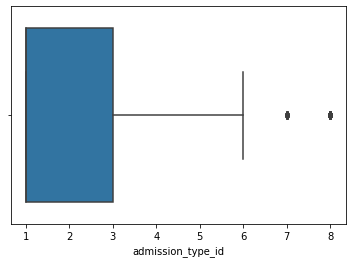

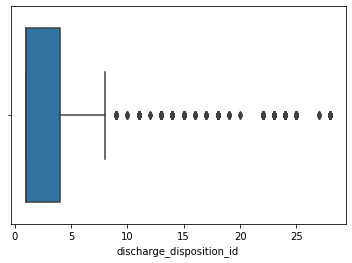

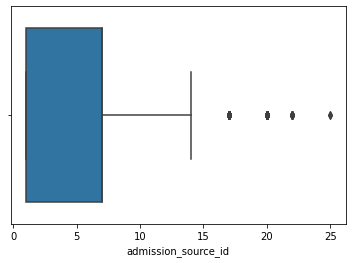

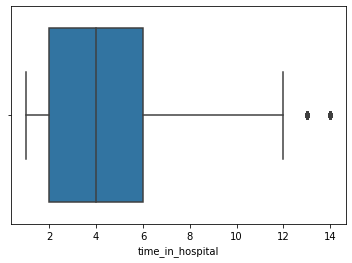

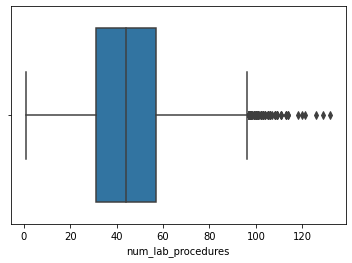

...

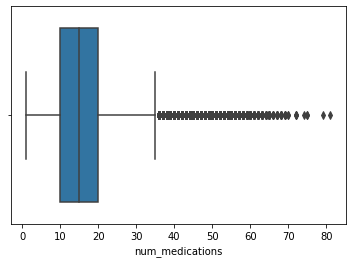

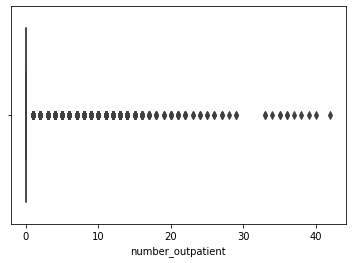

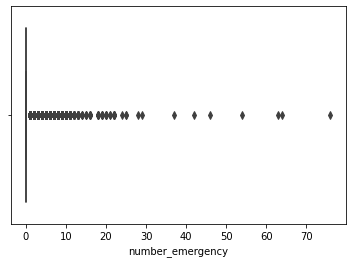

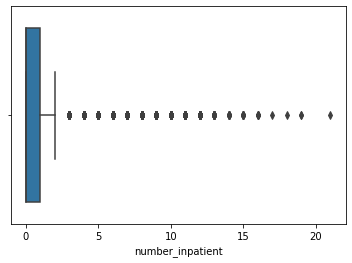

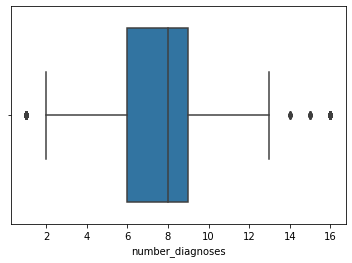

In [8]:
# boxplots for describing the results of EDA
for var in df:
    if var in ('admission_type_id','discharge_disposition_id','admission_source_id','time_in_hospital','num_lab_procedures',
                'num_procedures','num_medications','number_outpatient','number_emergency','number_inpatient','number_diagnoses'):
        plt.figure(var)
        sns.boxplot(x = df[var])

In [9]:
# boxplots for describing the results of EDA
for var in df:
    if var in ('admission_type_id','discharge_disposition_id','admission_source_id','time_in_hospital','num_lab_procedures',
                'num_procedures','num_medications','number_outpatient','number_emergency','number_inpatient','number_diagnoses'):
        plt.close(var)

In [7]:
# The outliers in our data are in the reasonable range so there is no point in dropping them.

# Exploratory Data Analysis

In [10]:
#1. Are there any missing values in the dataset?

# Counting the missing values by column
df.isna().sum()

#Ans: There are no missing values in the dataset as can be seen from the output

encounter_id                0
patient_nbr                 0
race                        0
gender                      0
age                         0
weight                      0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
payer_code                  0
medical_specialty           0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazo

In [11]:
# dropping duplicates
df.drop_duplicates()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,MC,?,51,0,16,0,0,0,250.13,291,458,9,None,>8,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,MC,?,33,3,18,0,0,1,560,276,787,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,MC,?,53,0,9,1,0,0,38,590,296,13,None,None,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,MC,Surgery-General,45,2,21,0,0,1,996,285,998,9,None,None,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO


In [12]:
#3. How many unique customers are there in the dataset?

df['patient_nbr'].describe()
unique_customers = df['patient_nbr'].nunique()
print(unique_customers)

# There are 71518 unique customers

71518


In [13]:
#Checking for summary statistics, missing values, correlations and distributions through ProfileReport
#checking summary statistics
df.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [14]:
# Character to check
character_to_check = '?'

# Check and count the entries that contain '?'
count = (df.applymap(lambda x: character_to_check in str(x))).sum().sum()

print(f"The number of entries that contain '{character_to_check}': {count}")

The number of entries that contain '?': 192849


In [15]:
# remove the weight column as most of the entries are "?"

# removing payer_code and medical_specialty as they won't be important for analysis and a lot of values are "?"

# removing columns which have all the values as no : metformin-pioglitazone, metformin-rosiglitazone, glimepiride-pioglitazone
# glipizide-metformin, citoglipton, examide

# Removing all the columns which are irrelevant to the analysis like diag_1, diag_2, diag_3, patient_nbr, encounter_id
# Code of the primary and secondary diagnosis will have no relation with patient's readmission
# Similarly patient_nbr and encounter_id will have no significance

columns_to_drop = ['weight', 'payer_code', 'medical_specialty', 'metformin-pioglitazone', 'metformin-rosiglitazone', 
                   'glimepiride-pioglitazone', 'glipizide-metformin', 'citoglipton', 'examide','patient_nbr', 'encounter_id',
                  'diag_1', 'diag_2', 'diag_3']

for col in columns_to_drop:
    df = df.drop([col], axis=1)

In [16]:
# Character to check
character_to_check = '?'

# Initialize a dictionary to store the counts for each column
column_counts = {}

# Loop through each column and count the occurrences of '?'
for column in df.columns:
    count = df[column].apply(lambda x: character_to_check in str(x)).sum()
    if count != 0:
        column_counts[column] = count

# Print the counts for each column
for column, count in column_counts.items():
    print(f"{column} has {count} occurrences of '{character_to_check}'")

race has 2273 occurrences of '?'


In [17]:
# Checking datatype of each column
print(df.dtypes)

race                        object
gender                      object
age                         object
admission_type_id            int64
discharge_disposition_id     int64
admission_source_id          int64
time_in_hospital             int64
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride                 object
acetohexamide               object
glipizide                   object
glyburide                   object
tolbutamide                 object
pioglitazone                object
rosiglitazone               object
acarbose                    object
miglitol            

In [18]:
# Compute the mode for various column
mode_race = df['race'].mode()[0]
mode_gender = df['gender'].mode()[0]

# Convert categorical data to numerical data using replace
df['race'] = df['race'].str.strip().replace({'?': mode_race})
df['gender'] = df['gender'].str.strip().replace({'Unknown/Invalid': mode_gender})

In [19]:
# Character to check
character_to_check = '?'

# Initialize a dictionary to store the counts for each column
column_counts = {}

# Loop through each column and count the occurrences of '?'
for column in df.columns:
    count = df[column].apply(lambda x: character_to_check in str(x)).sum()
    if count != 0:
        column_counts[column] = count

# Print the counts for each column
for column, count in column_counts.items():
    print(f"{column} has {count} occurrences of '{character_to_check}'")

In [20]:
# No columns left with "?"

In [21]:
# Using .replace() to replace all the gender varibles to integer: 1 for female and 0 for male
df['gender']=df['gender'].replace({'Female': 1, 'Male': 0})

In [22]:
# Using .replace() to replace age range with the mean of age range
df['age']=df['age'].replace({'[0-10)': 5, '[10-20)': 15, '[20-30)': 25, '[30-40)': 35, '[40-50)': 55, 
                                   '[50-60)': 55, '[60-70)': 65,'[70-80)': 75,'[80-90)': 85,'[90-100)': 95})

In [23]:
# Using .replace() to replace all the boolean varibles of column diabetesMed to integer: 0 for No and 1 for Yes
df['diabetesMed']=df['diabetesMed'].replace({'Yes': 1, 'No': 0})

In [24]:
# Using .replace() to replace all the change varibles to integer: 1 for Ch and 0 for No
df['change']=df['change'].replace({'Ch': 1, 'No': 0})

In [25]:
# Using .replace() to replace Steady to 1 and No to 0 for the given columns
columns_to_change = ['acetohexamide', 'tolbutamide', 'miglitol', 'troglitazone']

for col in columns_to_change:
    df[col]=df[col].replace({'Steady': 1, 'No': 0})

In [26]:
# Using .replace() to replace all the readmitted varibles to integer: 1 for Ch and 0 for NO
# There are almost 4.5% patients being readmitted within 30 days
# Almost 18% of patients gets readmitted within 30 days or beyond

df['readmitted']=df['readmitted'].replace({'<30': 1, 'NO': 0, '>30':0})

In [27]:
df


,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,change,diabetesMed,readmitted
0,Caucasian,1,5,6,25,1,1,41,0,1,0,0,0,1,None,None,No,No,No,No,No,0,No,No,0,No,No,No,0,0,No,No,No,0,0,0
1,Caucasian,1,15,1,1,7,3,59,0,18,0,0,0,9,None,None,No,No,No,No,No,0,No,No,0,No,No,No,0,0,No,Up,No,1,1,0
2,AfricanAmerican,1,25,1,1,7,2,11,5,13,2,0,1,6,None,None,No,No,No,No,No,0,Steady,No,0,No,No,No,0,0,No,No,No,0,1,0
3,Caucasian,0,35,1,1,7,2,44,1,16,0,0,0,7,None,None,No,No,No,No,No,0,No,No,0,No,No,No,0,0,No,Up,No,1,1,0
4,Caucasian,0,55,1,1,7,1,51,0,8,0,0,0,5,None,None,No,No,No,No,No,0,Steady,No,0,No,No,No,0,0,No,Steady,No,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,AfricanAmerican,0,75,1,3,7,3,51,0,16,0,0,0,9,None,>8,Steady,No,No,No,No,0,No,No,0,No,No,No,0,0,No,Down,No,1,1,0
101762,AfricanAmerican,1,85,1,4,5,5,33,3,18,0,0,1,9,None,None,No,No,No,No,No,0,No,No,0,No,No,No,0,0,No,Steady,No,0,1,0
101763,Caucasian,0,75,1,1,7,1,53,0,9,1,0,0,13,None,None,Steady,No,No,No,No,0,No,No,0,No,No,No,0,0,No,Down,No,1,1,0
101764,Caucasian,1,85,2,3,7,10,45,2,21,0,0,1,9,None,None,No,No,No,No,No,0,Steady,No,0,Steady,No,No,0,0,No,Up,No,1,1,0


# # Normalizing/Scaling the data 

In [28]:
#dummy variables for the categorical ones
dummy = pd.get_dummies(df)

In [29]:
dummy

,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,acetohexamide,tolbutamide,troglitazone,change,diabetesMed,readmitted,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,max_glu_serum_>200,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>7,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,metformin_Down,metformin_No,metformin_Steady,metformin_Up,repaglinide_Down,repaglinide_No,repaglinide_Steady,repaglinide_Up,nateglinide_Down,nateglinide_No,nateglinide_Steady,nateglinide_Up,chlorpropamide_Down,chlorpropamide_No,chlorpropamide_Steady,chlorpropamide_Up,glimepiride_Down,glimepiride_No,glimepiride_Steady,glimepiride_Up,glipizide_Down,glipizide_No,glipizide_Steady,glipizide_Up,glyburide_Down,glyburide_No,glyburide_Steady,glyburide_Up,pioglitazone_Down,pioglitazone_No,pioglitazone_Steady,pioglitazone_Up,rosiglitazone_Down,rosiglitazone_No,rosiglitazone_Steady,rosiglitazone_Up,acarbose_Down,acarbose_No,acarbose_Steady,acarbose_Up,miglitol_0,miglitol_1,miglitol_Down,miglitol_Up,tolazamide_No,tolazamide_Steady,tolazamide_Up,insulin_Down,insulin_No,insulin_Steady,insulin_Up,glyburide-metformin_Down,glyburide-metformin_No,glyburide-metformin_Steady,glyburide-metformin_Up
0,1,5,6,25,1,1,41,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0
1,1,15,1,1,7,3,59,0,18,0,0,0,9,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0
2,1,25,1,1,7,2,11,5,13,2,0,1,6,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0
3,0,35,1,1,7,2,44,1,16,0,0,0,7,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0
4,0,55,1,1,7,1,51,0,8,0,0,0,5,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,0,75,1,3,7,3,51,0,16,0,0,0,9,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0
101762,1,85,1,4,5,5,33,3,18,0,0,1,9,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0
101763,0,75,1,1,7,1,53,0,9,1,0,0,13,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0
101764,1,85,2,3,7,10,45,2,21,0,0,1,9,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0


In [30]:
df_scaled = dummy.copy()
# skipping the non-numeric identifying columns
cols_to_scale =['age','admission_type_id','discharge_disposition_id','admission_source_id','time_in_hospital','num_lab_procedures',
                'num_procedures','num_medications','number_outpatient','number_emergency','number_inpatient','number_diagnoses'] 
scaler = StandardScaler()
scaler.fit(df_scaled[cols_to_scale])
df_scaled[cols_to_scale] = scaler.transform(df_scaled[cols_to_scale])

In [31]:
df_scaled

,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,acetohexamide,tolbutamide,troglitazone,change,diabetesMed,readmitted,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,max_glu_serum_>200,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>7,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,metformin_Down,metformin_No,metformin_Steady,metformin_Up,repaglinide_Down,repaglinide_No,repaglinide_Steady,repaglinide_Up,nateglinide_Down,nateglinide_No,nateglinide_Steady,nateglinide_Up,chlorpropamide_Down,chlorpropamide_No,chlorpropamide_Steady,chlorpropamide_Up,glimepiride_Down,glimepiride_No,glimepiride_Steady,glimepiride_Up,glipizide_Down,glipizide_No,glipizide_Steady,glipizide_Up,glyburide_Down,glyburide_No,glyburide_Steady,glyburide_Up,pioglitazone_Down,pioglitazone_No,pioglitazone_Steady,pioglitazone_Up,rosiglitazone_Down,rosiglitazone_No,rosiglitazone_Steady,rosiglitazone_Up,acarbose_Down,acarbose_No,acarbose_Steady,acarbose_Up,miglitol_0,miglitol_1,miglitol_Down,miglitol_Up,tolazamide_No,tolazamide_Steady,tolazamide_Up,insulin_Down,insulin_No,insulin_Steady,insulin_Up,glyburide-metformin_Down,glyburide-metformin_No,glyburide-metformin_Steady,glyburide-metformin_Up
0,1,-4.148145,2.750800,4.031022,-1.169873,-1.137649,-0.106517,-0.785398,-1.848268,-0.291461,-0.21262,-0.503276,-3.321596,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0
1,1,-3.478211,-0.708461,-0.514312,0.306482,-0.467653,0.808384,-0.785398,0.243390,-0.291461,-0.21262,-0.503276,0.815784,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0
2,1,-2.808277,-0.708461,-0.514312,0.306482,-0.802651,-1.631351,2.145781,-0.371804,1.286748,-0.21262,0.288579,-0.735733,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0
3,0,-2.138343,-0.708461,-0.514312,0.306482,-0.802651,0.045967,-0.199162,-0.002688,-0.291461,-0.21262,-0.503276,-0.218561,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0
4,0,-0.798475,-0.708461,-0.514312,0.306482,-1.137649,0.401761,-0.785398,-0.986997,-0.291461,-0.21262,-0.503276,-1.252906,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,0,0.541393,-0.708461,-0.135535,0.306482,-0.467653,0.401761,-0.785398,-0.002688,-0.291461,-0.21262,-0.503276,0.815784,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0
101762,1,1.211327,-0.708461,0.053854,-0.185636,0.202343,-0.513139,0.973309,0.243390,-0.291461,-0.21262,0.288579,0.815784,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0
101763,0,0.541393,-0.708461,-0.514312,0.306482,-1.137649,0.503417,-0.785398,-0.863958,0.497643,-0.21262,-0.503276,2.884475,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0
101764,1,1.211327,-0.016609,-0.135535,0.306482,1.877333,0.096794,0.387074,0.612506,-0.291461,-0.21262,0.288579,0.815784,0

# Random Forest

In [32]:
# At this stage, we have a lot of features, so clustering on them directly may lead to increased complexity and
# possible overfitting. Hence, we can use a dimensionality reduction technique like randome tree to reduce the number
# of features

In [33]:
len(df_scaled.columns)

87

In [34]:
# Random Forest: Random Forest can handle categorical features naturally. 
# Trees in a Random Forest can make decisions based on categorical splits, 
# making it suitable for datasets with mixed types of features, including both numerical and categorical.
# Random Forest: Random Forest can capture complex, non-linear relationships between features, 
# which is beneficial when dealing with categorical variables that may have non-linear effects on the target variable.

# Hence selecting Random Forest for feature selection. 

In [35]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier

In [95]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
np.random.seed(4684)

train, test = train_test_split(df_scaled, test_size = 0.3)
  
#build the model
rf = RandomForestClassifier(n_estimators=100, max_features=3, oob_score=True)
rf.fit(train.drop('readmitted', axis=1), train['readmitted'])
  
#let's print OOB accuracy and confusion matrix
print(
"OOB accuracy is", 
rf.oob_score_, 
"\n", 
"OOB Confusion Matrix", 
"\n",
pd.DataFrame(confusion_matrix(train['readmitted'], rf.oob_decision_function_[:,1].round(), labels=[0, 1]))
)

OOB accuracy is 0.8878656858891572 
 OOB Confusion Matrix 
        0   1
0  63193  88
1   7900  55


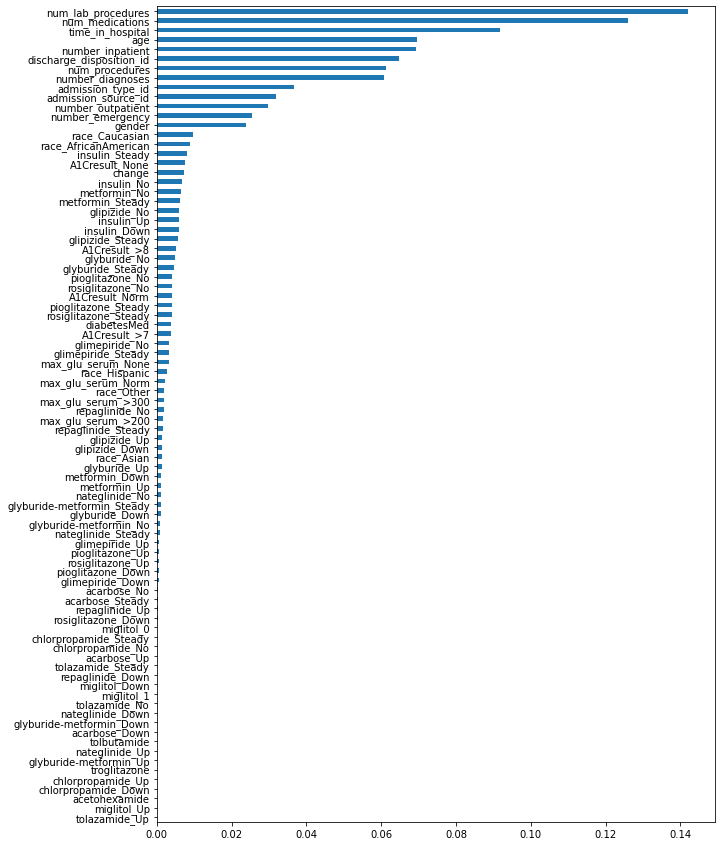

In [96]:
feat_importances = pd.Series(rf.feature_importances_, index=train.drop('readmitted', axis=1).columns)
plt.figure(figsize=(10, 15))  # Adjust the width (10) and height (6) as needed
feat_importances.sort_values().plot(kind='barh')
plt.show()

[[27112    16]
 [ 3387    15]]


Accuracy:88.85%
Precision:48.39%
Recall:0.44%
F1-Score:0.87%


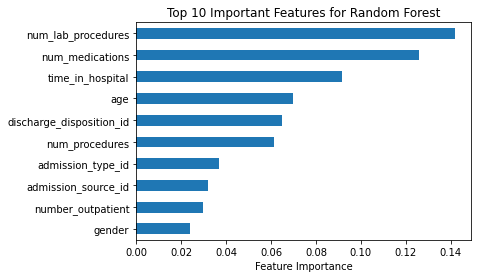

In [97]:
y_test_pred = rf.predict(test.drop('readmitted', axis=1))

print(confusion_matrix(test['readmitted'], y_test_pred))
print("\n\nAccuracy:{:,.2f}%".format(accuracy_score(test['readmitted'], y_test_pred)*100))
print("Precision:{:,.2f}%".format(precision_score(test['readmitted'], y_test_pred)*100))
print("Recall:{:,.2f}%".format(recall_score(test['readmitted'], y_test_pred)*100))
print("F1-Score:{:,.2f}%".format(f1_score(test['readmitted'], y_test_pred)*100))

feat_importances = pd.Series(rf.feature_importances_, index=train.drop('readmitted', axis=1).columns)
feat_importances = feat_importances[0:10]
feat_importances.sort_values().plot(kind='barh')
plt.xlabel("Feature Importance")
plt.title("Top 10 Important Features for Random Forest")
plt.show()

In [98]:
#and let's print test accuracy and confusion matrix
print(
"Test accuracy is", rf.score(test.drop('readmitted', axis=1),test['readmitted']), 
"\n", 
"Test Set Confusion Matrix", 
"\n",
pd.DataFrame(confusion_matrix(test['readmitted'], rf.predict(test.drop('readmitted', axis=1)), labels=[0, 1]))
)

Test accuracy is 0.8885358663609564 
 Test Set Confusion Matrix 
        0   1
0  27112  16
1   3387  15


# Decision Tree

In [99]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score


In [100]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(train.drop('readmitted', axis=1), train['readmitted'])

#Training accuracy
y_train_pred = clf.predict(train.drop('readmitted', axis=1))

print(pd.DataFrame(confusion_matrix(train['readmitted'], y_train_pred, labels=[0, 1])))
print(classification_report(train['readmitted'], y_train_pred, labels = [0, 1]))

       0     1
0  63281     0
1      0  7955
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     63281
           1       1.00      1.00      1.00      7955

    accuracy                           1.00     71236
   macro avg       1.00      1.00      1.00     71236
weighted avg       1.00      1.00      1.00     71236



[[23633  3495]
 [ 2783   619]]


Accuracy:79.44%
Precision:15.05%
Recall:18.20%
F1-Score:16.47%


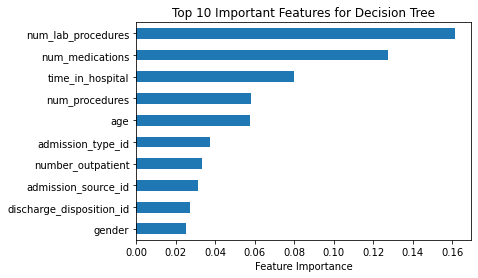

In [101]:
#https://stackoverflow.com/questions/62819569/how-to-return-the-features-that-used-in-decision-tree-that-created-by-decisiontr

#Testing Accuracy 
y_test_pred= clf.predict(test.drop('readmitted', axis=1))

print(confusion_matrix(test['readmitted'], y_test_pred))
print("\n\nAccuracy:{:,.2f}%".format(accuracy_score(test['readmitted'], y_test_pred)*100))
print("Precision:{:,.2f}%".format(precision_score(test['readmitted'], y_test_pred)*100))
print("Recall:{:,.2f}%".format(recall_score(test['readmitted'], y_test_pred)*100))
print("F1-Score:{:,.2f}%".format(f1_score(test['readmitted'], y_test_pred)*100))

feat_importances = pd.Series(clf.feature_importances_, index=train.drop('readmitted', axis=1).columns)
feat_importances = feat_importances[0:10]
plt.xlabel("Feature Importance")
plt.title("Top 10 Important Features for Decision Tree")
feat_importances.sort_values().plot(kind='barh')
plt.show()

# Clustering

In [40]:
# Checking for up to 20 clusters
wcss = [] #Within-cluster sum of squares
#Selecting all the impotant feature
feature=df_scaled[['num_lab_procedures','num_medications','time_in_hospital','age',
                   'number_inpatient','discharge_disposition_id','num_procedures','number_diagnoses','admission_type_id',
                   'admission_source_id','number_outpatient','number_emergency','gender']]

for i in range(1,20):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(feature)
    wcss.append(kmeans_pca.inertia_)

/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 1

Text(0, 0.5, 'WCSS')

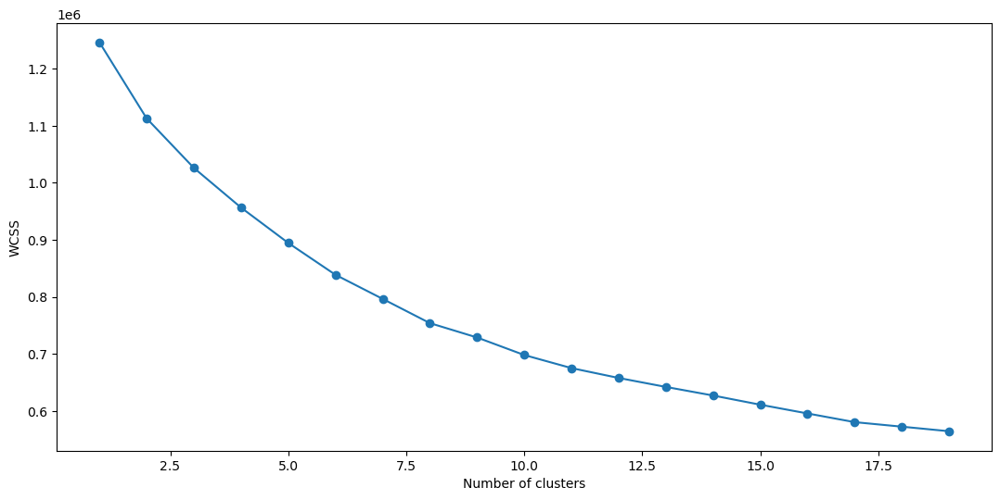

In [43]:

# Removing the target variable for clustering
data_for_clustering = train.drop('readmitted', axis=1)

# Deciding on the number of clusters using elbow method

plt.figure(figsize=(13,6))
plt.plot(range(1,20), wcss, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

In [ ]:
# Here we do not observe an elbow so will use silhouette_score to determine the number of clusters

/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 1

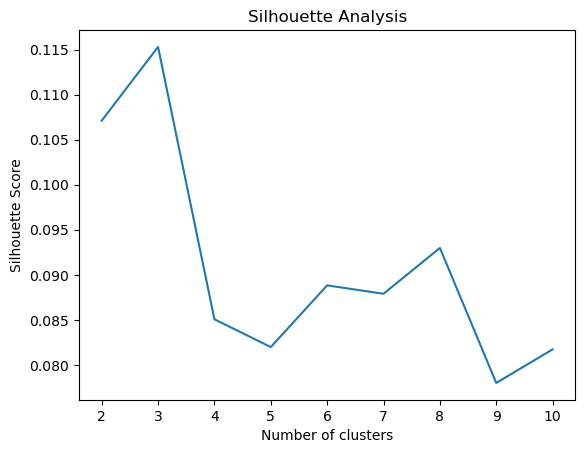

In [50]:
from sklearn.metrics import silhouette_score

sil = []

# Assuming you want to check up to 10 clusters
for k in range(2, 11):
    kmeans = KMeans(n_clusters = k).fit(data_for_clustering)
    preds = kmeans.predict(data_for_clustering)
    sil.append(silhouette_score(data_for_clustering, preds, metric = 'euclidean'))

plt.plot(range(2, 11), sil)
plt.title('Silhouette Analysis')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [ ]:
# To find the optimal number of clusters (k), observe the plot and find the value of k for which there is a sharp 
# and steep fall of the distance. This is will be an optimal point of k where an elbow occurs.
# So K value=3 and number of clusters=3

In [67]:
optimal_clusters = 3 
kmeans = KMeans(n_clusters=optimal_clusters)
df_scaled['cluster'] = kmeans.fit_predict(df_scaled)

/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


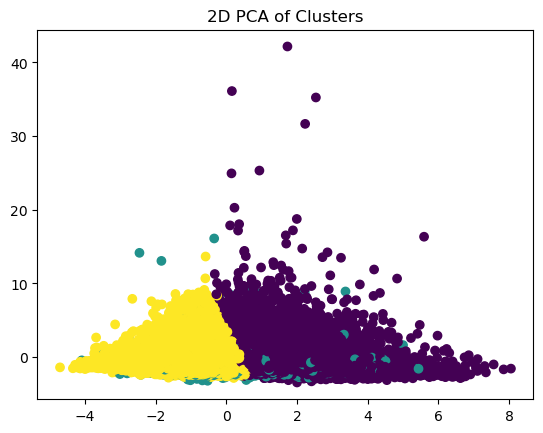

In [70]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_scaled.drop('cluster', axis=1))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c=df_scaled['cluster'])
plt.title("2D PCA of Clusters")
plt.show()

In [ ]:
#There are 2 disctinctly differentiable clusters. So we will take K=2

In [72]:
optimal_clusters = 2 
kmeans = KMeans(n_clusters=optimal_clusters)
df_scaled['cluster'] = kmeans.fit_predict(df_scaled)

/Users/gupta/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


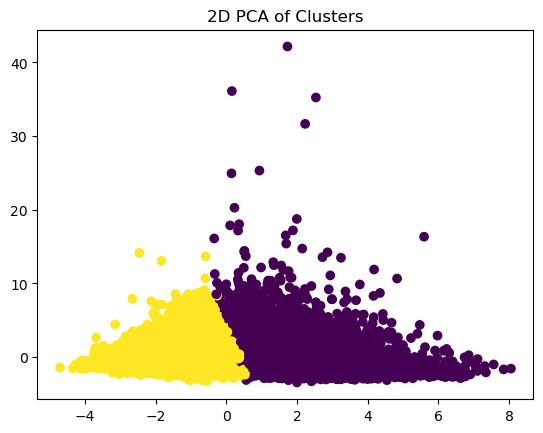

In [73]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_scaled.drop('cluster', axis=1))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c=df_scaled['cluster'])
plt.title("2D PCA of Clusters")
plt.show()

In [ ]:
# This seems to be more reasonable. So we will go ahead with this

In [74]:
cluster_stats = df_scaled.groupby('cluster').agg(['mean'])
print(cluster_stats)

           gender       age admission_type_id discharge_disposition_id  \
             mean      mean              mean                     mean   
cluster                                                                  
0        0.553291  0.177022         -0.050975                 0.267971   
1        0.528490 -0.103055          0.029675                -0.156001   

        admission_source_id time_in_hospital num_lab_procedures  \
                       mean             mean               mean   
cluster                                                           
0                 -0.004310         0.846090           0.581336   
1                  0.002509        -0.492558          -0.338429   

        num_procedures num_medications number_outpatient number_emergency  \
                  mean            mean              mean             mean   
cluster                                                                     
0             0.389547        0.779203          0.108812      

In [69]:
churn_cluster_table = pd.crosstab(df_scaled['readmitted'], cluster)
print(churn_cluster_table)

col_0           0
readmitted       
0           90409
1           11357


Based on the provided cluster data, here is a summary:

## Cluster 0:

- Patients in this cluster seem to be slightly older (`age` mean is positive) when compared to the overall mean.
- These patients tend to have longer `time_in_hospital` and undergo more `num_lab_procedures`.
- On average, they have been on more medications (`num_medications`).
- This group appears to have more `number_outpatient`, `number_emergency`, and `number_inpatient` visits.
- In terms of medications and treatments, cluster 0 patients are more likely to have changed their medications (`change`) and are more often on diabetes medication (`diabetesMed`).
- A higher proportion of patients in this cluster are `race_Caucasian`.
- This cluster also has a slightly higher readmission rate (`readmitted`).

## Cluster 1:

- Patients in this cluster are younger on average.
- They have shorter `time_in_hospital` stays and fewer `num_lab_procedures`.
- These patients are on fewer medications on average.
- They tend to have fewer outpatient, emergency, and inpatient visits.
- This group is less likely to have changed their medications and is slightly less often on diabetes medication.
- A higher proportion of patients in this cluster are `race_AfricanAmerican` and `race_Hispanic`.
- The readmission rate for this cluster is slightly lower.

## Summary

In summary, Cluster 0 seems to represent patients who are older, have more health complications, and are more engaged with the healthcare system, as seen by their higher hospital times, lab procedures, and readmission rates. Cluster 1, on the other hand, seems to be younger patients who are less engaged with the healthcare system, have fewer complications, and a slightly lower readmission rate. 
